# Artificial Neural Networks in Fixed Income Markets for Yield Curve Forecasting

In this project we replicate the results of the above paper to understand the potential of neural networks to forecast yields. We try to understand the reach and limitations of neural networks.

The authors propose mainly two types of models - Single Task Learning (STL) and Multi Task Learning (MTL) to forecast individual yields for per time step and forecasting them together 

### Notes:

The initial data was extracted using Bloomberg through the additional information provided by Dr. Manuel Nunesa.

After extracting the data, we calculate other features eg: the moving averages in excel and obtain the 159 original features.

This was then used to develop the 795 addidional features according to the paper.

## Index

* [1. Getting Started](#1)
    * [1.1. Loading necessary libraries](#1.1)    
    * [1.2. Loading the data](#1.2)  
    * [1.3. Nature of the Dataset](#1.3)
    * [1.4. Handling missing data](#1.4)
    * [1.5. Generating additional features](#1.5)
    
* [2. Developing the models](#2)
    
    * [2.1. Lasso feature selection](#2.1)    
    * [2.2. Linear Regression Model](#2.2)
    * [2.3. Relevant features models: Non-normalised and normalised](#2.3)
        * [2.3.1. Relevant Feature non-normalised model](#2.3.1)
        * [2.3.2. Relevant Feature normalised model](#2.3.2)
    * [2.4. Target Only model](#2.4)
    * [2.5. Relevant Feature + Linear Regression data model](#2.5)
    * [2.6. Target Only + Linear Regression data model](#2.6)
    * [2.7. Multi-Task Learning](#2.7)
    
    
    
    
* [3. Training the models](#3)
    * [3.1. Training the STL model](#3.1)    
    * [3.2. Training non-normalised model](#3.2)
    * [3.3. Training the MTL model](#3.3)
    
* [4. Results](#4)        
    * [4.1. STL: MSE values per yield per forecasting horizon](#4.1)
    * [4.2. Normalized Vs non-normalized metrics](#4.2)
    * [4.3. Forecasting results for 10Y](#4.3) 
    * [4.4. STL Vs  MTL: 0 days and 20 days](#4.4) 

<a id='1'></a>
## 1. Getting Started
---------------------------------

<a id='1.1'></a>
### 1.1. Loading necessary packages

In [1]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, random

from sklearn.preprocessing import StandardScaler,Normalizer
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError

<a id='1.2'></a>
### 1.2. Loading the data

In [3]:
file_paths="/kaggle/input/data-kirk-oswald/data_ann (2).csv"
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)

<a id='1.3'></a>
### 1.3. Nature of the dataset
The processed data is the historical values of the 159 features and from 1998 to 2017

<a id='1.4'></a>
### 1.4. Handling missing data

In [5]:
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

<a id='1.5'></a>
### 1.5. Generating additional features
We generate the additional 795 features by implementing the 5 timesteps for each feature, hence 5 x 159 = 795 additional features

In [6]:
def feature_generation_for_models(df,feature_of_Interest):
    
    '''
    
    
    Input: The dataframe and the name of the feature that we are interested in

    Output: returns a dataframe with the relevant features


    '''
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    
    #just a precaution if there is any missing data
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    data = df

    
    # target column names 
    target_columns = data.columns[-5:]

    
    # Generate features for original features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

   
    return features_with_lags

<a id='2'></a>
# 2. Developing the models
---------------------------------

 #### We develop six different models 
 
 #### 1. Linear Regression 
 
 #### 2. Neural Network relevant Featature :
 
             MLP model using feature selection to determine the relevant features
 
 #### 3. Neural Network Target Only :
 
             MLP model with target feature only
 
 #### 4. Neural Net relevant Feature + Linear Regression : 
 
             MLP using feature selection to obtain relevant features and generate synthetic additional feature using linear regression
 
 #### 5. Neural Net Target Only + Linear Regression :
 
             MLP with target feature and generate synthetic additional feature using linear regression
              
 #### 6. Multi Task Learning (MLt )Neural Net relevant features :
 
             MLP with RELEVANT features for more than 1 target. Fix the horizon and forecast the yields

<a id='2.1'></a>
### 2.1. Lasso feature selection

In order to select features we use lasso with an regularization of 4  

In [7]:
def lasso_feature_selection(X_train,y_train):
        
    '''
    
    Input: Training and testing features to figure out the relevant features

    Output: Returns a list of column names of relevant features

    '''
    
    lasso_model = Lasso(alpha=4) # we choose an alpha of 4 here
    lasso_model.fit(X_train, y_train)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    return selected_columns

<a id='2.2'></a>
### 2.2. Linear Regression Model

The linear regression model is widely used forecasting mainly due to its simplicity. Here we make predictions for the targets that we feed in which is a combination of yields and forecasting horizons and also obtain the various loss metrics

In [8]:
def linear_reg_model(df,feature_of_Interest):
    
    
    '''
    
    
    Input: the feature that we are interested in

    Output: returns a dictionary of metrics of the model
   
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)


    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]
    
    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    
    # normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  

    
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)
    predictions = model.predict(X_test_forecast)
    
    
    # Computing the mse error metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    mse_values=(predictions - y_test_forecast)**2
    
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

<a id='2.3'></a>
### 2.3. Relevant features models: Non-normalised and normalised

<a id='2.3.1'></a>
#### 2.3.1. Relevant Feature non-normalised model

We do not normalize the data before feeding it into the NN just to compare it with the losses of the normalized model

In [9]:
def NN_RelFeat_non_normalized(df,feature_of_Interest):

    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    #Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)
    X_train_normalized=X_train[list(selected_columns)]
    X_test_normalized=X_test[list(selected_columns)]

    
    # Select 50 random points from the test set 
    random.seed(42) 
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    
    
    # Loss metrics and values
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

<a id='2.3.2'></a>
#### 2.3.2. Relevant Feature normalised model

We determine the relevant features using lasso and feed it into the MLP with 10 fully connected layers

In [10]:
def NN_RelFeat(df, feature_of_Interest):
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''

    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]
    

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    # Lasso feature selection
    selected_columns = lasso_feature_selection(X_train,y_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    #normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    
    
    # Select 50 random points from the test set 
    random.seed(42)
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    
    
    #loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

<a id='2.4'></a>
### 2.4. Target Only model
Here, we feed only the target data into the neural network

In [11]:
def NN_TgtOnly(df,feature_of_Interest):

    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    
    
    # Normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]

    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    
    
    #Loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))

    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


<a id='2.5'></a>
### 2.5. Relevant Feature + Linear Regression data model
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the relevant features

In [12]:
#NN RelFeat+LRdata
def RealFeat_LRdata(df,feature_of_Interest):
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    
    # Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    #Normalizing the data
    scaler = StandardScaler()
    X_train_normalized1 = scaler.fit_transform(X_train)
    X_test_normalized1 = scaler.transform(X_test)
    
    
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)
    
    
    # Generating synthetic data for train and test sets
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    
    # Imputing the synthetic data
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]
    

    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    # Make predictions
    predictions = model.predict(X_test_forecast)
    
    
    # Loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

<a id='2.6'></a>
### 2.6. Target Only + Linear Regression data model
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the the target feature only. The additional feature using the LR model acts as synthetic feature for the MLP

In [13]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(df,feature_of_Interest):
    
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
   

    # Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)    
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    # Lasso feature selection
    scaler = StandardScaler()
    X_train_normalized1 = scaler.fit_transform(X_train)
    X_test_normalized1 = scaler.transform(X_test)
    
    
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)
    
    
    # generate synthetic data
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    
    # Imputing synthetic data
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    
    # Imputing the target only data aswell
    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    
    # Normalizing the data
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    
    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  

    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    # Make Predictions
    predictions = model.predict(X_test_forecast)
    
    
    
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
        
    return a

<a id='2.7'></a>
### 2.7. Multi-Task Learning
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the the target feature only. The additional feature using the LR model acts as synthetic feature for the MLP

In [14]:
def mlt_RelFeat(df,feature_of_Interest):
    
    '''
    
    
    Input: The feature that we are interested in. 
    
    Output: Returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    features_with_lags=feature_generation_for_models(df,feature_of_Interest[0])
    
    
    target_columns=feature_of_Interest

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    selected_columns=lasso_feature_selection(X_train,y_train)
    
    
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    
    
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    

    # Select 50 random points from the test set 
    random.seed(42) 
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    
    
    
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a

<a id='3'></a>
### 3. Training the models
----------


<a id='3.1'></a>
#### 3.1. Training the STL model

In [15]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        target_=j+str(i)
        a=linear_reg_model(df,target_)
        b=NN_RelFeat(df,target_)
        c=NN_TgtOnly(df,target_)
        d=RealFeat_LRdata(df,target_)
        e=NN_TgtOnly_LRdata(df,target_)
        if (i==1 and target_=='GECU10YR_lag_1'):
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

Epoch 1/500

33/33 [==============================] - 2s 11ms/step - loss: 7.2784 - mae: 2.3761 - mse: 7.2784 - root_mean_squared_error: 2.6979 - val_loss: 4.0969 - val_mae: 1.7975 - val_mse: 4.0969 - val_root_mean_squared_error: 2.0241

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 3.7304 - mae: 1.6468 - mse: 3.7304 - root_mean_squared_error: 1.9314 - val_loss: 1.6898 - val_mae: 1.1059 - val_mse: 1.6898 - val_root_mean_squared_error: 1.2999

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 1.3379 - mae: 0.8938 - mse: 1.3379 - root_mean_squared_error: 1.1567 - val_loss: 0.4828 - val_mae: 0.4733 - val_mse: 0.4828 - val_root_mean_squared_error: 0.6949

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.6675 - mae: 0.5581 - mse: 0.6675 - root_mean_squared_error: 0.8170 - val_loss: 0.2943 - val_mae: 0.3212 - val_mse: 0.2943 - val_root_mean_squared_error: 0.5425

Epoch 5/500

33/33 [==============================]

<a id='3.2'></a>

#### 3.2. Training non-normalised model

In [16]:
table4_non_normalized = NN_RelFeat_non_normalized(df,'GECU10YR_lag_1')
normalised_metrics=fig_5['GECU10YR_lag_1']
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

Epoch 1/800

33/33 [==============================] - 1s 10ms/step - loss: 3722698.5000 - mae: 1538.0626 - mse: 3722698.5000 - root_mean_squared_error: 1929.4296 - val_loss: 525626.9375 - val_mae: 570.6989 - val_mse: 525626.9375 - val_root_mean_squared_error: 725.0013

Epoch 2/800

33/33 [==============================] - 0s 3ms/step - loss: 502995.1562 - mae: 594.7941 - mse: 502995.1562 - root_mean_squared_error: 709.2215 - val_loss: 386738.9062 - val_mae: 531.9182 - val_mse: 386738.9062 - val_root_mean_squared_error: 621.8834

Epoch 3/800

33/33 [==============================] - 0s 3ms/step - loss: 378226.9688 - mae: 531.3143 - mse: 378226.9688 - root_mean_squared_error: 615.0016 - val_loss: 319335.1250 - val_mae: 480.8661 - val_mse: 319335.1250 - val_root_mean_squared_error: 565.0975

Epoch 4/800

33/33 [==============================] - 0s 3ms/step - loss: 323526.5312 - mae: 486.9706 - mse: 323526.5312 - root_mean_squared_error: 568.7939 - val_loss: 276885.9688 - val_mae: 445.9542

<a id='3.3'></a>
#### 3.3. Training the MTL model

In [17]:
# training the MultiTask model for the horizons 
horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        target_=j+str(i)
        q=mlt_RelFeat(df,[target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 7.3350 - mae: 2.3854 - mse: 7.3350 - root_mean_squared_error: 2.7083 - val_loss: 4.1357 - val_mae: 1.8059 - val_mse: 4.1357 - val_root_mean_squared_error: 2.0336

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 3.8066 - mae: 1.6616 - mse: 3.8066 - root_mean_squared_error: 1.9510 - val_loss: 1.7011 - val_mae: 1.1107 - val_mse: 1.7011 - val_root_mean_squared_error: 1.3042

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 1.3529 - mae: 0.8963 - mse: 1.3529 - root_mean_squared_error: 1.1631 - val_loss: 0.5008 - val_mae: 0.4839 - val_mse: 0.5008 - val_root_mean_squared_error: 0.7077

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.6747 - mae: 0.5662 - mse: 0.6747 - root_mean_squared_error: 0.8214 - val_loss: 0.2913 - val_mae: 0.3231 - val_mse: 0.2913 - val_root_mean_squared_error: 0.5397

Epoch 5/500

33/33 [==============================] 

#### Note: The following bit of code helps us verify the nested array which is the combination for horizons, yields and models

In [18]:
# output: list_mse1
# gives the name of the feature_lag_model
# eg: GECU3M_lag_1_lr, here 1 is the horizon and lr is linear regression model

horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [19]:
#i=horizon
#j=year
#k=the model

------------------------------------

<a id='4'></a>
### 4. Results

<a id='4.1'></a>
#### 4.1. STL: MSE values per yield per forecasting horizon

We notice from the plots that the model tends to perform well with optimal training and feature selection based on the paper. 

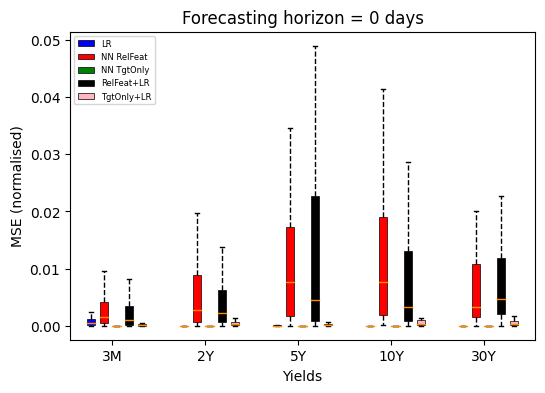

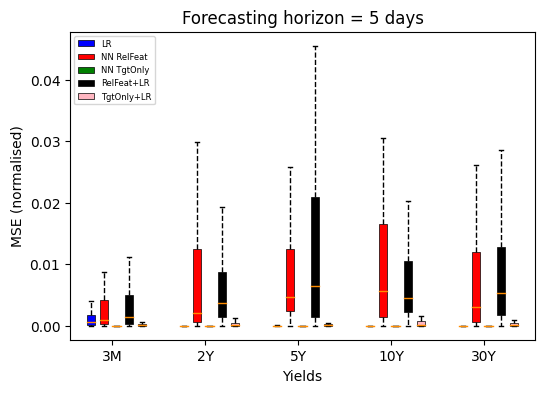

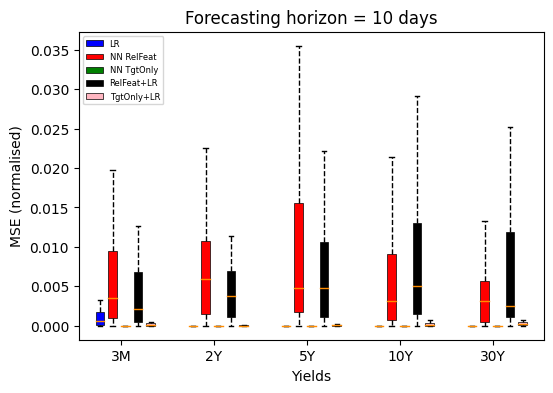

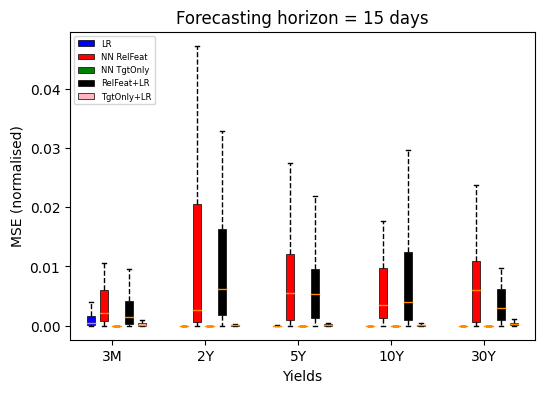

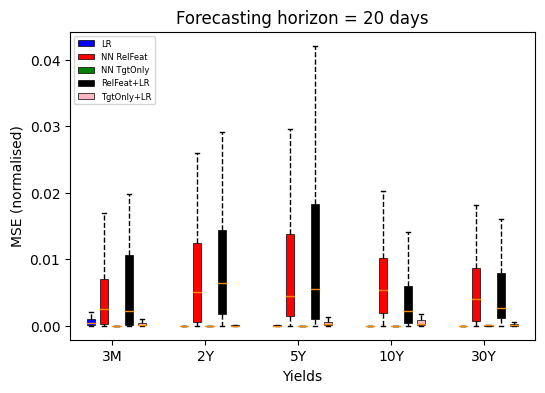

In [20]:
axis=['3M','2Y','5Y','10Y','30Y']
def plot_function1(i):
    
    '''

    Function generates the graphs

    Input: number of horizons 

    Output: returns the plot data as a nested list

    '''
    
    horizon=[1,6,11,16,21]
    titles="Forecasting horizon = " + str(horizon[i]-1) + " days"
    data = {}

    for j in range(0, 5):
        list1 = {}
        for k in range(0, 5):
            if k==0:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'LR':list_mse[i][j][k]})

            elif k==1:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'NN RelFeat':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'NN RelFeat':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'NN RelFeat':list_mse[i][j][k]})
            elif k==2:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'NN TgtOnly':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'NN TgtOnly':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'NN TgtOnly':list_mse[i][j][k]})
            elif k==3:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'RelFeat+LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'RelFeat+LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'RelFeat+LR':list_mse[i][j][k]})
            else:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'TgtOnly+LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'TgtOnly+LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'TgtOnly+LR':list_mse[i][j][k]})

        key = axis[j]
        data.update({key: list1})


    #Extract keys and values from the data dictionary
    outer_keys = list(data.keys())
    inner_keys = list(data[outer_keys[0]].keys())

    # Define colors for each inner key
    colors = {
        'LR': 'blue',
        'NN RelFeat': 'red',
        'NN TgtOnly': 'green',
        'RelFeat+LR': 'black',
        'TgtOnly+LR': 'lightpink'
    }

    # Create a box plot for each inner key on the same chart with grouping
    plt.figure(figsize=(6, 4))
    legend_labels = []
    group_width = 2.2  # Adjust the width between groups

    for i, inner_key in enumerate(inner_keys):
        positions = [j * group_width + i * 0.3 for j in range(len(outer_keys))]
        for j, outer_key in enumerate(outer_keys):
            values = [data[outer_key][inner_key]]

            box = plt.boxplot(values, positions=[positions[j]],
                              showfliers=False, patch_artist=True, widths=0.2)

            # Customize box colors
            for patch, color in zip(box['boxes'], [colors[inner_key]]):
                patch.set_facecolor(color)
                patch.set_linewidth(0.5)
            # Customize mean line color
            for line in box['medians']:
                line.set_color('darkorange')

            # Customize whiskers as dashed lines
            for whisker in box['whiskers']:
                whisker.set_linestyle('--')

        legend_labels.append((patch, inner_key))

    # Add legends
    plt.legend([label[0] for label in legend_labels], [label[1] for label in legend_labels], loc='upper left', prop={'size': 6})

    plt.title(titles)
    plt.xticks([j * group_width + 0.5 for j in range(len(outer_keys))], outer_keys)
    plt.xlabel('Yields')
    plt.ylabel('MSE (normalised)')
    plt.show()    
    return data
# we call the plots in a loop
for i in range(len(horizons)):
    plot_function1(i)

<a id='4.2'></a>
#### 4.2. Normalized Vs non-normalized metrics

In [21]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.096576,0.065352,0.635554,0.389047
1,MSE,0.013598,0.015907,0.555287,0.541224
2,RMSE,0.116610,0.065352,0.745176,0.389047


<a id='4.3'></a>
#### 4.3. Forecasting results for 10Y



The scatter plot and the fit line helps us understand how well our model is making predictions. If there is less dispution then the predictions are good and vice versa. Here we see less dispurtions and hence conclude that the predictions are good

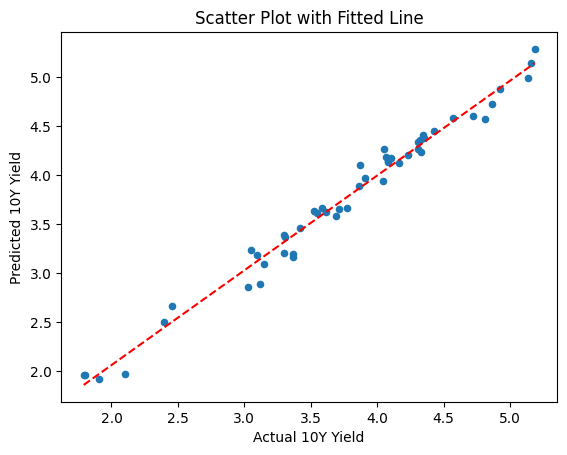

In [22]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}
df_fit_line = pd.DataFrame(data=d)

df_fit_line = df_fit_line.sort_values(by='Actual 10Y Yield')
df_fit_line.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# fit a line
fit = np.polyfit(df_fit_line['Actual 10Y Yield'], df_fit_line['Predicted 10Y Yield'], 1)

plt.plot(df_fit_line['Actual 10Y Yield'], np.polyval(fit, df_fit_line['Actual 10Y Yield']), 'r--')

plt.show()

<a id='4.4'></a>
#### 4.4. STL Vs  MTL: 0 days and 20 days

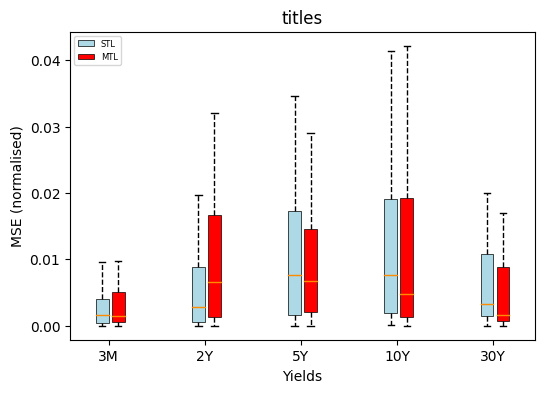

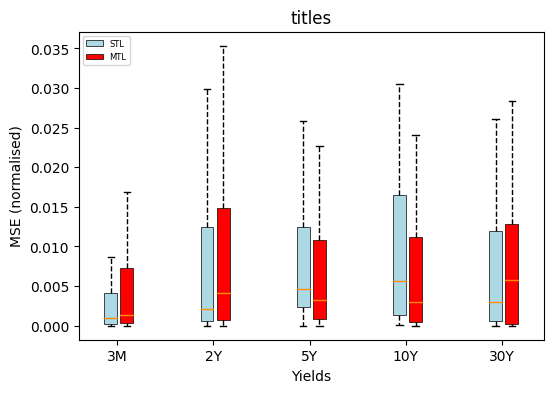

In [23]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''


    Function generates the graphs

    Input: number of horizons 

    Output: returns the plot data as a nested list


    '''
    horizon=[1,21]
    titles="Forecasting horizon = " + str(horizon[i]-1) + " days"
    
    data = {}
    for j in range(0, 5):
        list1 = {}

        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.update({'STL':list_mse[i][j][1].values.flatten()})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.update({'STL':list_mse[i][j][1].flatten()})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        else:
            list1.update({'STL':list_mse[i][j][1]})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        key = axis[j]
        data.update({key: list1})

    #Extract keys and values from the data dictionary
    outer_keys = list(data.keys())
    inner_keys = list(data[outer_keys[0]].keys())

    # Define colors for each inner key
    colors = {
        'STL': 'lightblue',
        'MTL': 'red'
    }

    # Create a box plot for each inner key on the same chart with grouping
    
    plt.figure(figsize=(6, 4))
    legend_labels = []
    group_width = 1.5  

    for i, inner_key in enumerate(inner_keys):
        positions = [j * group_width + i * 0.25 for j in range(len(outer_keys))]
        for j, outer_key in enumerate(outer_keys):
            values = [data[outer_key][inner_key]]

            box = plt.boxplot(values, positions=[positions[j]],
                              showfliers=False, patch_artist=True, widths=0.2)

           
            for patch, color in zip(box['boxes'], [colors[inner_key]]):
                patch.set_facecolor(color)
                patch.set_linewidth(0.5)
                
            
            for line in box['medians']:
                line.set_color('darkorange')

           
            for whisker in box['whiskers']:
                whisker.set_linestyle('--')

        legend_labels.append((patch, inner_key))

    # Add legends
    plt.legend([label[0] for label in legend_labels], [label[1] for label in legend_labels], loc='upper left', prop={'size': 6})

    plt.title(titles)
    plt.xticks([j * group_width + 0.1 for j in range(len(outer_keys))], outer_keys)
    plt.xlabel('Yields')
    plt.ylabel('MSE (normalised)')
    plt.show()    
    return data
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)

Forecasting horizons of 0 days and 20 days for the above

We notice from the plot that models with 10 hidden units with appropriate feature selection provides low errors and good predictions

#### Conclusion

The idea in this project is to re-develop the models in the paper to understand the capabilities and pitfalls of neural networks. There is a need for more research to understand the reach of Multi-Task Learning models and how to improve them.

We infer that there is an exponential increase in model complexity if we incorporate the horizons. This complexity must be tackled for efficient and accurate predictions using the MTL models.

From a finance point of view, we may not know if these models can handle and provide extreme scenarios like the twisting and steepening of the curve and also negative interest rates. Hence, additional study is required by isolating those extreme scenarios and testing the model for them. 

Overall, the models replicated in this study can help financial practitioners expand on the features/parameters like FX, balance sheet, emerging markets and other information for the MTL to estimate the curve.